# Object Detection with KerasCV

**Author:** [lukewood](https://twitter.com/luke_wood_ml), Ian Stenbit, Tirth Patel<br>
**Date created:** 2023/04/08<br>
**Last modified:** 2023/08/10<br>
**Description:** Train an object detection model with KerasCV.

KerasCV предлагает полный набор API для решения задач обнаружения объектов. Эти API-интерфейсы включают в себя методы расширения данных, специфичные для обнаружения объектов, встроенные в Keras метрики COCO, утилиты преобразования формата ограничивающих рамок, инструменты визуализации, предварительно обученные модели обнаружения объектов и все, что вам нужно для обучения ваших собственных современных моделей обнаружения объектов!

Давайте рассмотрим API обнаружения объектов в KerasCV.

In [2]:
!pip install -q --upgrade keras-cv
!pip install -q --upgrade keras  # Upgrade to Keras 3.

In [1]:
import os

os.environ["KERAS_BACKEND"] = "jax"  # @param ["tensorflow", "jax", "torch"]

from tensorflow import data as tf_data
import tensorflow_datasets as tfds
import keras
import keras_cv
import numpy as np
from keras_cv import bounding_box
import os
from keras_cv import visualization
import tqdm

## Введение в обнаружение объектов

Обнаружение объектов - это процесс идентификации, классификации и локализации объектов в пределах заданного изображения. Как правило, входными данными являются изображения, а метками - ограничивающие рамки с необязательными метками классов. Обнаружение объектов можно рассматривать как расширение классификации, однако вместо обозначения одного класса для изображения вы должны обнаружить и локализовать произвольное количество классов.

**Например:**

<img width="300" src="https://i.imgur.com/8xSEbQD.png">

Данные для приведенного выше изображения могут выглядеть примерно так:
```python
image = [height, width, 3]
bounding_boxes = {
  "classes": [0], # 0 is an arbitrary class ID representing "cat"
  "boxes": [[0.25, 0.4, .15, .1]]
   # bounding box is in "rel_xywh" format
   # so 0.25 represents the start of the bounding box 25% of
   # the way across the image.
   # The .15 represents that the width is 15% of the image width.
}
```

С появлением [*You Only Look Once*](https://arxiv.org/abs/1506.02640)
(aka YOLO), задачи по обнаружению объектов решаются с помощью глубокого обучения.
Большинство архитектур машинного обучения делают умное разбиение одной задачи по обнаружению, на множество небольших задач по классификации и множество задач по регрессии.

Если быть более точным, то происходит генерация многоякорных рамок различных форм и размеров на входном изображении и каждой рамке присваивается класс, в соответствии со смещением по x, y, ширине и высоте. Модель обучается предсказывать класс каждой рамки, в соответствии со смещениями по осям x и y, ширине, высоте для каждой рамки с предполагаемым объектом.

**Пример визуализации якорных рамок**:

<img width="400" src="https://i.imgur.com/cJIuiK9.jpg">

Обнаружение объектов технически сложная задача, но к счастью, мы можем предложить безупречный подход для получения отличного результата. Приступим!


## Обнаружение с помощью предобученной модели

![](https://storage.googleapis.com/keras-nlp/getting_started_guide/prof_keras_beginner.png)

Самый верхний уровень API в KerasCV это интерфейс обнаружения объектов: `keras_cv.models`. Этот API включает полностью предобученную модель по обнаружению объектов, такую как `keras_cv.models.YOLOV8Detector`.

Давайте начнем с построения модели YOLOV8Detector предобученной на наборе данных `pascalvoc`.

In [2]:
## в переменную pretrained_model загружается предобученная модель по обнаружению объектов YOLOV8Detector
pretrained_model = keras_cv.models.YOLOV8Detector.from_preset(
    "yolo_v8_m_pascalvoc", bounding_box_format="xywh" ## формат объектных рамок
)

Заметили аргумент с названием `bounding_box_format`?

Вспоминаем, ранее описанный, формат словаря bounding boxes:

```
bounding_boxes = {
  "classes": [num_boxes],
  "boxes": [num_boxes, 4]
}
```

Данный аргумент описывает какой *точно* будет формат значений у ключа "boxes" в словаре, который отправится далее по конвейеру. Например, рамка в формате `xywh` в ее верхнем левом углу имеет координаты $x=100$, $y=100$, ширина 55 и высота 70, тогда значение будут выглядеть:
```
[100, 100, 55, 75]
```

что эквивалентно значению в формате `xyxy`:
```
[100, 100, 155, 175]
```

Кажется очень простым, но это критически важный момент в понимании API обнаружения объектов в KerasCV!
Каждому компоненту, вычисляющему рамки объектов, требуется аргумент `bounding_box_format`.

Подробнее о KerasCV, вы можете почитать тут: [in the API docs](https://keras.io/api/keras_cv/bounding_box/formats/).

Так получилось, из-за того что нет единого стандарта, описывающего формат объектной рамки! В различных конвейерах, его компоненты ожидают разные форматы, таким образом, их нужно указывать явно, для того, чтобы наш код оставался читаемым, переиспользуемым и ясным.

Баг связанный с неправильным форматом объектной рамки, возможно, самый частый баг, лежащий в основе проблем обнаружения внутри конвейера - и явно указывая формат мы исключаем подобные баги (особенно если копипастим код из разных источников).

Далее, давайте загрузим изображение:

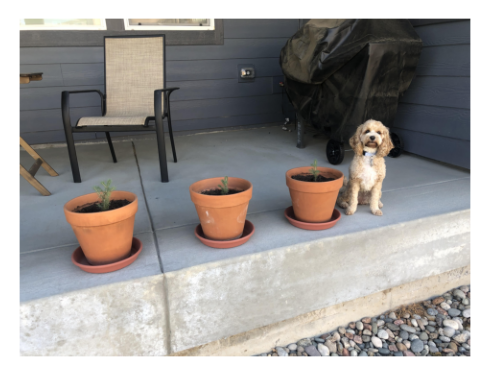

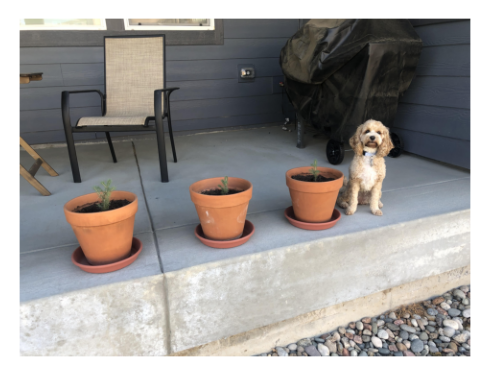

In [3]:
#URL fetch failure on https://i.imgur.com/gCNcJJI.jpg: 429 -- Unknown Error - недействительный адрес
filepath = keras.utils.get_file(origin="https://keras.io/img/guides/object_detection_keras_cv/object_detection_keras_cv_8_0.png")
image = keras.utils.load_img(filepath)
image = np.array(image)

visualization.plot_image_gallery(
    np.array([image]),
    value_range=(0, 255),
    rows=1,
    cols=1,
    scale=5,
)

Для использования архитектуры `YOLOV8Detector` с сеткой ResNet50 в качестве основы, вам нужно изменить размеры картинки, так чтобы они были кратны 64.
Это нужно для того, чтобы быть уверенным в совместимости с количеством точек разрешения, при дальнейшем уменьшении размерностей в сверточных уровнях сети ResNet.

Если, операция изменения размера исказит входное соотношение, модель будет более слабой. Для предобученной модели `yolo_v8_m_pascalvoc`, те настройки которые мы используем, отразятся на конечной метрике `MeanAveragePrecision`, на примере набора данных `pascalvoc/2012` расчетный коэффициент упадет до `0.15` с `0.38`, при использовании встроенных операций изменения размеров.

Вдобавок, если для сохранения пропорций применить обрезку, как это делается в задачах по классификации, то ваша модель может вовсе потерять часть рамок. И если, требуется сохранить соотношения сторон, то мы рекомендуем использовать padding (дополнение пустотой), чтобы дополнить короткую сторону пустотой до более длинной при изменении разрешения.

С помощью KerasCV изменения размеров изображения делается легко: необходимо задать аргумент `pad_to_aspect_ratio=True` в слое `keras_cv.layers.Resizing`.

Это можно сделать одной строчкой кода:

In [4]:
# предпроцессный слой служит для изменения размера
inference_resizing = keras_cv.layers.Resizing(
    640,  # желаемая высота картинки в пикселях
    640,  # желаемая ширина картинки в пикселях
    pad_to_aspect_ratio=True,  # прибавить пустоту для соблюдения пропорций
    bounding_box_format="xywh"  # формат объектных рамок
)

Передадим дальше по конвейеру:

In [5]:
# методу inference_resizing() передаем картинку в виде тензора, обратно получаем обработанный тензор
image_batch = inference_resizing([image])

`keras_cv.visualization.plot_bounding_box_gallery()` поддерживает параметр `class_mapping` для определения классов объектных рамок.

Давайте отобразим наши классы.

In [7]:
class_ids = [  # ID классов
    "Aeroplane", # самолет
    "Bicycle", # велосипед
    "Bird", # птица
    "Boat", # лодка
    "Bottle", # бутылка
    "Bus", # автобус
    "Car", # машина
    "Cat", # кошка
    "Chair", # стул
    "Cow", # корова
    "Dining Table", # столик
    "Dog", # собака
    "Horse", # лошадь
    "Motorbike", # мотоцикл
    "Person", # человек
    "Potted Plant", # цветочный горшок
    "Sheep", # овца
    "Sofa", # диван
    "Train", # поезд
    "Tvmonitor", # ТВ-экран
    "Total", # все остальное
]

class_mapping = dict(zip(range(len(class_ids)), class_ids))  # помещаем все классы в словарь

Как и в любой другой модели, в нашей `keras.Model` мы можем предсказать объектные рамки с помощью интерфейса `model.predict()`.

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


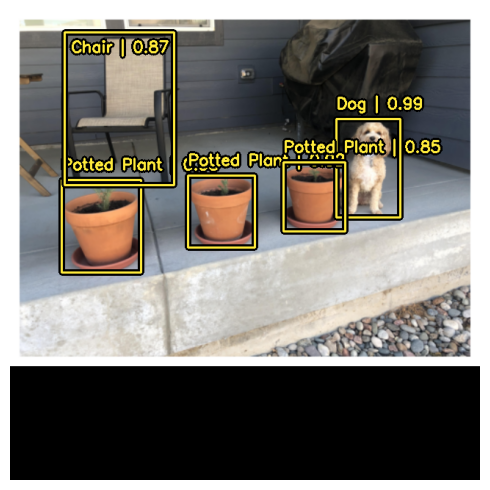

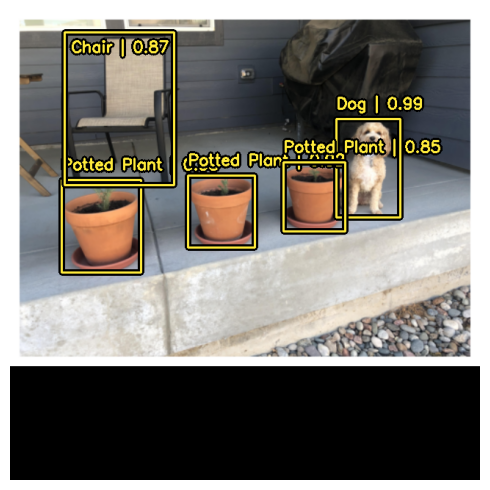

In [8]:
# в метод predict() передаем обработанный тензор изображения
# тензор изображения обрабатывается с помощью предобученной модели
# на выходе получаем предсказанный словарь тензоров
y_pred = pretrained_model.predict(image_batch)

# словарь y_pred содержит следующие тензоны:
# {"classes": ..., boxes": ..., confidence: ..., num_detections: ...} - подробное описание ниже в тексте
# визуализация объектных рамок на картинке
visualization.plot_bounding_box_gallery(
    image_batch, # обработанное изображение
    value_range=(0, 255), # диапазон значений пикселей
    rows=1, # количество строк в галерее на выходе
    cols=1, # количество столбцов в галерее на выходе
    y_pred=y_pred, # указатель на тензор с предсказанными данными, на основе него строим рамки на выходном рисунке
    scale=5, # масштаб изображения
    font_scale=0.7, # размер шрифта
    bounding_box_format="xywh", # формат объектных рамок
    class_mapping=class_mapping, # указатель на словарь с классами объектов, для обозначения их на выходном рисунке
)

> Переменная y_pred - это словарь, в котором каждый элемент содержит тензоры, т.е. массивы с параметрами.  
В нашем случае, словарь содержит следующие тензоры:  
**boxes**: содержит 5 массивов с параметрами конкретной объектной рамки, каждый массив имеет 4 значения - x, y, w(idth), h(ight)  
**confidence**: уровень уверенности, в том что конкретная рамка является тем, чем ее распознали (относительный параметр)  
**classes**: индексы (номера) распознанных классов объектов  
**num_detections**: количество найденных классов

---

Для поддержания простоты во входном потоке, KerasCV применяет метод подавления немаксимумов (NMS) в классе `YOLOV8Detector`. Метод подавления немаксимумов - традиционный компьютерный алгоритм, который решает задачу обнаружения моделью множества рамок для одного и того же объекта.

Подавление немаксимумов хорошо настраиваемый алгоритм, вам в большинстве случаев нужно будет лишь указать аргументы для метода немаксимумов. Это можно сделать с помощью переопределения аргумента `prediction_decoder`.

Для демонстрации такой концепции, давайте временно отключим подавление немаксимумов в нашей модели YOLOV8Detector.
Это можно сделать, дописав атрибут `prediction_decoder`.

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


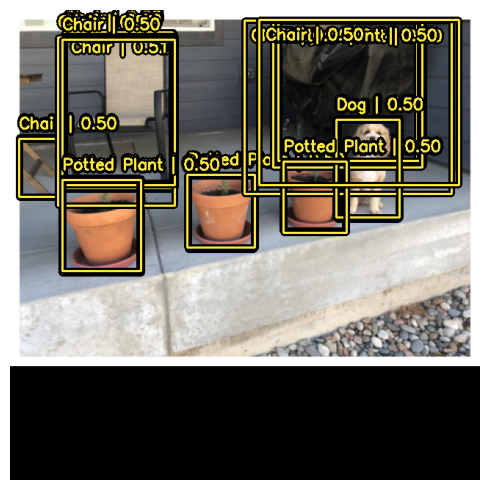

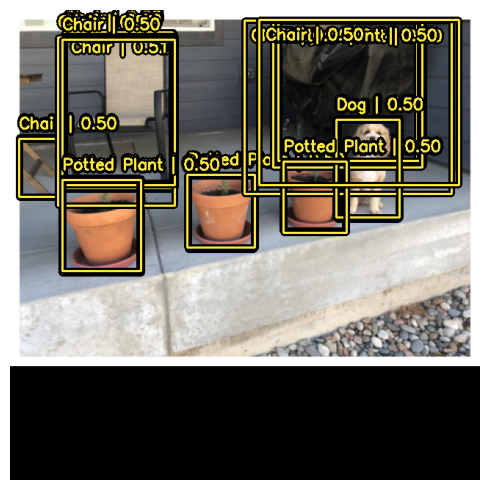

In [9]:
# Метод NonMaxSuppression слой предназначен для регулирования подавления немаксимумов
prediction_decoder = keras_cv.layers.NonMaxSuppression(
    bounding_box_format="xywh", # формат рамок
    from_logits=True, # отключаем использование в этом слое функций активации
    iou_threshold=1.0, # значение данного порога равное единице, означает полно отключение подавление немаксимумов
    confidence_threshold=0.0, # порог уровня уверенности равную нулю, позволяет отобразить все предполагаемые объектные рамки
)

# предобученная модель YOLO
pretrained_model = keras_cv.models.YOLOV8Detector.from_preset(
    "yolo_v8_m_pascalvoc", # конкретный тип модели YOLO, обученной на наборе данных Pascal VOC
    bounding_box_format="xywh", # формат объектных рамок
    prediction_decoder=prediction_decoder, # указатель на слой декодера без подавления немаксимумов
)

# получаем тензор от предобученной модели
y_pred = pretrained_model.predict(image_batch)

# визуализируем картинки с объектными рамками
visualization.plot_bounding_box_gallery(
    image_batch, # обработанная картинка
    value_range=(0, 255), # диапазон значений пикселей
    rows=1, # кол-во строк в галерее
    cols=1, # кол-во столбцов в галерее
    y_pred=y_pred, # указатель на тензор с предсказанными значениями
    scale=5, # масштаб
    font_scale=0.7, # размер шрифта
    bounding_box_format="xywh", # формат объектных рамок
    class_mapping=class_mapping, # указатель на словарь с классами
)

Далее, давайте перенастроим `keras_cv.layers.NonMaxSuppression` для нашего примера! Мы настроим параметр `iou_threshold` на `0.2` и параметр `confidence_threshold` на `0.7`.

Увеличение значение параметра `confidence_threshold`, влияет на модель так, что на выходе будут объектные рамки с более высоким уровнем доверия.  
`iou_threshold` контролирует порог "пересечения над слиянием" (IoU), который будет таким, чтобы из двух рамок осталась только одна.

[Более подробное описание данного параметра смотрите в документации TensorFlow API docs](https://www.tensorflow.org/api_docs/python/tf/image/combined_non_max_suppression)

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


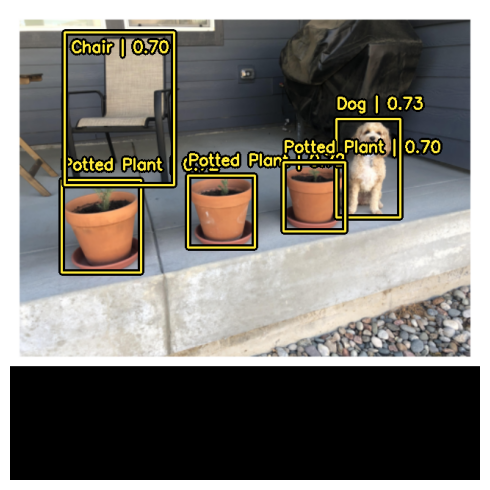

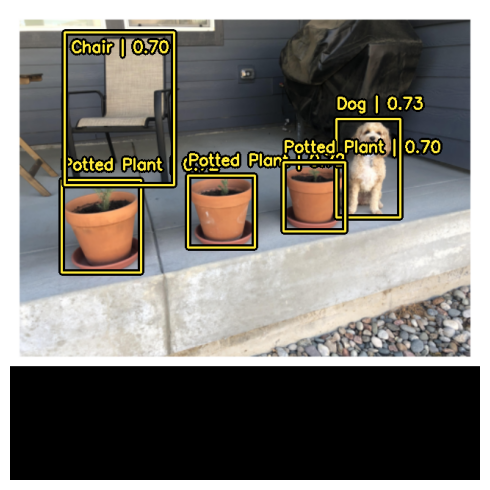

In [10]:
# слой NonMaxSuppression, позволяет контролировать подавление немаксимумов
prediction_decoder = keras_cv.layers.NonMaxSuppression(
    bounding_box_format="xywh", # формат объектных рамок
    from_logits=True, # применение логитов, позволяет обойтись без функции активации в данном слое.
    iou_threshold=0.2, # уменьшая порог IOU, отсекаем плохо распознаные объекты
    confidence_threshold=0.7, # настройка порога уверенности позволяет контролировать подавление немаксимумов
)

# получаем настройки предобученной модели YOLO
pretrained_model = keras_cv.models.YOLOV8Detector.from_preset(
    "yolo_v8_m_pascalvoc", # модель YOLO, предобученная на картинках из набора Pascal VOC
    bounding_box_format="xywh", # формат объектных рамок
    prediction_decoder=prediction_decoder, # тип декодера, в нашем случае, он определен выше - подавление немаксимумов
)

# получаем тензоры предсказаний
y_pred = pretrained_model.predict(image_batch)

# визуализации объектных рамок
visualization.plot_bounding_box_gallery(
    image_batch, # указатель на обработанную картинку
    value_range=(0, 255), # диапазон пикселей картинки
    rows=1, # кол-во строк
    cols=1, # кол-во столбцов
    y_pred=y_pred, # указатель на тензор с предсказанными параметрами
    scale=5, # масштаб картинки
    font_scale=0.7, # размер шрифтов
    bounding_box_format="xywh", # формат объектных рамок
    class_mapping=class_mapping, # указатель на словарь с классами объектов
)

Так гораздо лучше!

## Обучение нестандартных моделей

![](https://storage.googleapis.com/keras-nlp/getting_started_guide/prof_keras_advanced.png)

Не важно, любитель ли вы в области обнаружения объектов, либо уже ветеран, сборка конвейера по обнаружению объектов с нуля, будет являться сложным делом, в любом случае. К счастью, все интерфейсы по обнаружению объектов в KerasCV построены по модульному принципу. Не важно, нужен ли вам готовый контейнер, либо просто модель по обнаружению, либо просто механизм преобразования формата из `xywh` в формат `xyxy`, KerasCV все это осилит.

В данном руководстве, мы собираем полностью обучаемый конвейер для модели обнаружения объектов на основе KerasCV. Включая загрузку данных, аугментацию, расчет метрик и вывод!

Для начала, давайте разберемся со всеми входными данными и зададим глобальные параметры.

In [11]:
BATCH_SIZE = 4

## Загрузка данных

Давайте определим форматы для загрузки и объектных рамок. KerasCV имеет предопределенный формат для рамок. Чтобы все это скомпоновать вместе, необходимо упаковать параметры рамок в словарь, как описано ниже:

```
bounding_boxes = {
    # num_boxes may be a Ragged dimension
    'boxes': Tensor(shape=[batch, num_boxes, 4]),
    'classes': Tensor(shape=[batch, num_boxes])
}
```

`bounding_boxes['boxes']` содержит координаты рамок в формате `bounding_box_format` поддерживаемым KerasCV.

KerasCV требует, чтобы аргумент `bounding_box_format` содержал все параметры, относящиеся к объектным рамкам. Это сделано для увеличения ваших возможностей по включению индивидуальных параметров в конвейер, также, позволяя коду быть самодокументированным на протяжении всего конвейера.

Что бы соответствовать стилю API KerasCV, рекомендуется задать загрузчик данных, используя аргумент `bounding_box_format`. Тогда тем, кто будет использовать ваш загрузчик данных, будет понятно, какой формат используется.  
В этом примере, мы задаем формат для рамок вида `xywh`.

Пример:

```python
train_ds, ds_info = your_data_loader.load(
    split='train', bounding_box_format='xywh', batch_size=8
)
```

Это задаст точный формат для рамок вида `xywh`. Об этом подробнее можно почитать в документации KerasCV в разделе формат рамок [в документации по API](https://keras.io/api/keras_cv/bounding_box/formats/).

Наши данные загружаются в формате `{"images": images, "bounding_boxes": bounding_boxes}`. Данный формат поддерживается всеми предварительными компонентами KerasCV.

Давайте загрузим данные и проверим, что данные выглядят как ожидается.

In [12]:
# функция визуализации данных
# на вход поступают аргументы: датасет, диапазон пикселей, кол-во строк, кол-во колонок, формат рамок
def visualize_dataset(inputs, value_range, rows, cols, bounding_box_format):
    inputs = next(iter(inputs.take(1))) # создание итерируемого объекта из словаря тензоров картинки
    images, bounding_boxes = inputs["images"], inputs["bounding_boxes"] # призвоения соответсвующим переменным тензоров из словаря данных
    visualization.plot_bounding_box_gallery( # функция прорисовки картинок
        images, # тензор изображения
        value_range=value_range, # диапазон пикселей
        rows=rows, # кол-во строк
        cols=cols, # кол-во колонок
        y_true=bounding_boxes, # тензор предсказаний
        scale=5, # масштаб
        font_scale=0.7, # размер шрифта
        bounding_box_format=bounding_box_format, # формат объектных рамок
        class_mapping=class_mapping, # словарь объектных классов
    )

In [13]:
# функция распаковки (преобразования) "сырых" (необработанных) данных
def unpackage_raw_tfds_inputs(inputs, bounding_box_format): # на входе элементы словаря, и формат данных
    image = inputs["image"] # значение словаря по ключ image присваиваем переменной image
    # переменной рамок boxes присваивается конвертированное значения в соответствии с переданным форматом
    boxes = keras_cv.bounding_box.convert_format(
        inputs["objects"]["bbox"],
        images=image, # текущая картинка переданная из функции load_pascal_voc
        source="rel_yxyx", # исходный относительный формат
        target=bounding_box_format, # конечный заданный формат
    )
    bounding_boxes = { # словарь формата объектных рамок
        "classes": inputs["objects"]["label"], # классы
        "boxes": boxes, # рамки
    }
    # возвращает словарь содержащий картинки и их форматы
    return {"images": image, "bounding_boxes": bounding_boxes}

In [15]:
# функция загрузки данных
def load_pascal_voc(split, dataset, bounding_box_format):
    # процедура загрузки сырых данных, с разбиением на части с тусованием
    ds = tfds.load(dataset, split=split, with_info=False, shuffle_files=True)
    # структуризация данных по заданному формату с помощью параметра bounding_box_format
    ds = ds.map(
        # каждый элемент набора данных обрабатывается функцией unpackage_raw_tfds_inputs, возвращающей словарь
        lambda x: unpackage_raw_tfds_inputs(x, bounding_box_format=bounding_box_format),
        # настройка производительности - параллельные вычисления
        num_parallel_calls=tf_data.AUTOTUNE,
    )
    return ds # возвращаем датасет

In [16]:
# Загружаем тренировочные данные
train_ds = load_pascal_voc(split="train", # параметр, указывающий какую часть данных загрузить: train, test или validation
                           dataset="voc/2007", # указываем тип и версия набора данных
                           bounding_box_format="xywh") # формат объектных рамок

# Загружаем тестовые данные
eval_ds = load_pascal_voc(split="test",
                          dataset="voc/2007",
                          bounding_box_format="xywh")

# перемешиваем тренировочные данные блоками, в блоке 16 единиц данных
train_ds = train_ds.shuffle(BATCH_SIZE * 4)

Next, let's batch our data.

In KerasCV object detection tasks it is recommended that
users use ragged batches of inputs.
This is due to the fact that images may be of different sizes in PascalVOC,
as well as the fact that there may be different numbers of bounding boxes per
image.

To construct a ragged dataset in a `tf.data` pipeline, you can use the
`ragged_batch()` method.

In [17]:
len(train_ds), len(eval_ds)

(2501, 4952)

In [18]:
# сократим тестовую выборку (10-20% от тренировочной)
eval_ds = eval_ds.take(len(eval_ds)//10)
len(eval_ds)

495

Далее, давайте разобьем наши данные на пакеты.

В KerasCV для задач обнаружения объектов, пользователям рекомендуется применять разбиение данных на пакеты. Данный подход хорошо работает с изображениями разных размеров из датасета PascalVOC и даже с разным количеством объектных рамок на картинках.

Чтобы разбить датасет на пакеты в конвейере `tf.data`, можно использовать метод `ragged_batch()`.

In [19]:
train_ds = train_ds.ragged_batch(BATCH_SIZE,  # разбиваем тренировочные данные на пакеты по 4 элемента
                                 drop_remainder=True)  # отбрасывать не полные пакеты

eval_ds = eval_ds.ragged_batch(BATCH_SIZE,  # разбиваем тестовые данные на пакеты по 4 элемента
                               drop_remainder=True)  # отбрасывать не полные пакеты

Давайте удостоверимся, что наш датасет соответствует ожидаемому формату KerasCV. Используя функцию `visualize_dataset()`, вы можете проверить, что ваши данные в том формате, который ожидает KerasCV. Если объектные рамки не видны, или видны в ошибочных местах, это верный признак того, что данные используют неправильный формат.

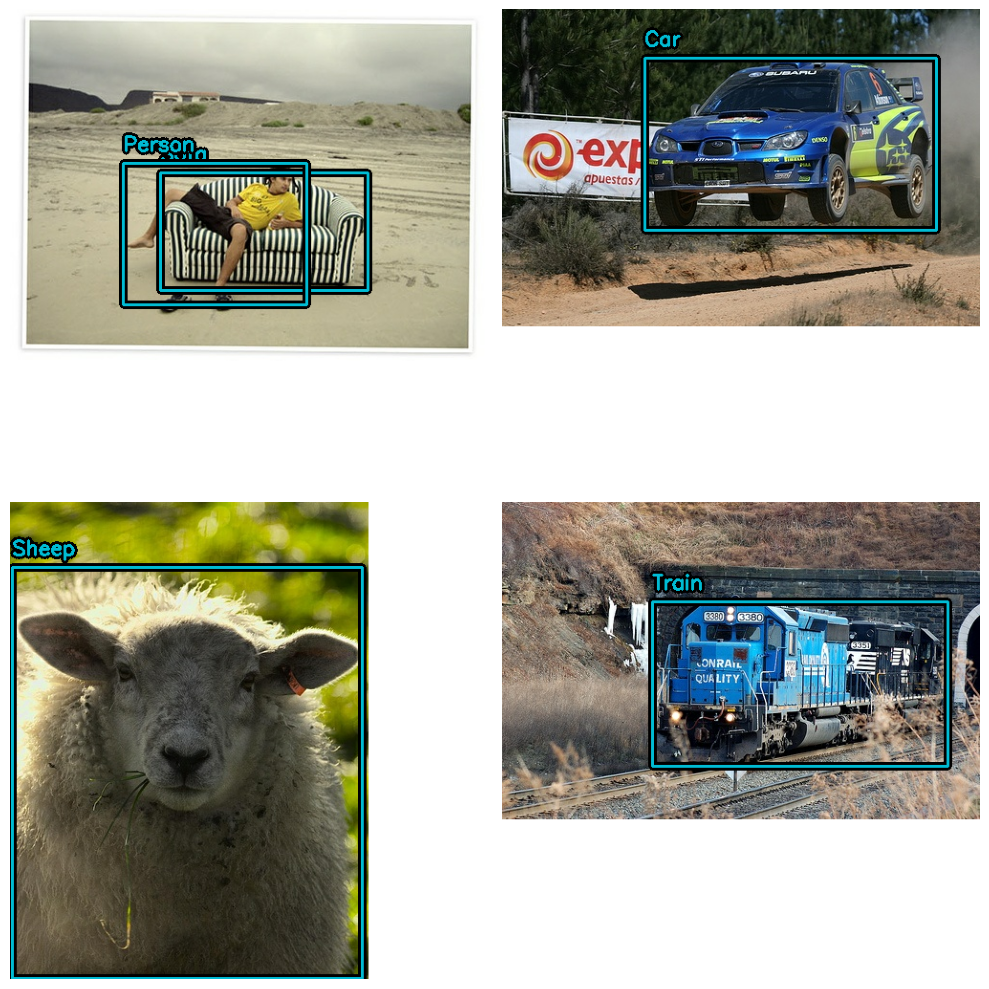

In [20]:
# функция визуализация тренировочного набора данных
visualize_dataset(
    train_ds, bounding_box_format="xywh", value_range=(0, 255), rows=2, cols=2
)

И для тестового набора:

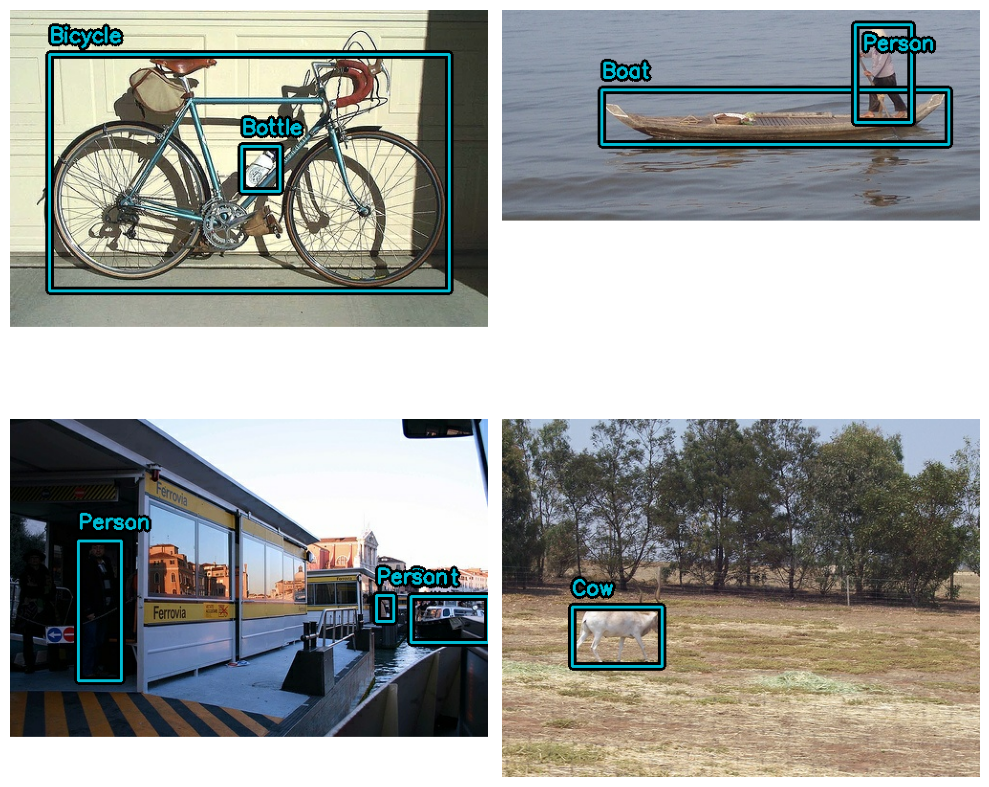

In [21]:
# Визуализация тестового набора данных
visualize_dataset(
    eval_ds,  # тестовый набор данных
    bounding_box_format="xywh",  # формат данных
    value_range=(0, 255),  # диапазон значений пикселей
    rows=2,  # количество картинок в строке
    cols=2,  # количество столбцов в строке
    # Если эксперимент запускается не на локальной машине, можно также
    # указать через функцию `visualize_dataset()` вывод в файл с помощью переменной `path`:
    # path="eval.png"
)

Похоже на то, что все структурировано, как и ожидалось. Теперь мы можем перейти к процессу создания конвейера аугментации данных.

## Аугментация данных

Одной из сложнейших задач в процессе создания конвейера по обнаружению образов, является аугментация данных. Техника аугментации изображения должна учитывать характеристики объектных рамок и с ними должны происходить соответствующие изменения.

К счастью, KerasCV поддерживает аугментацию объектных рамок, используя расширенную библиотеку [data augmentation layers](https://keras.io/api/keras_cv/layers/preprocessing/).

Далее код загружает набор данных Pascal VOC, и на лету применяет, дружелюбную для объектных рамок аугментацию данных внутри конвейера `tf.data`.

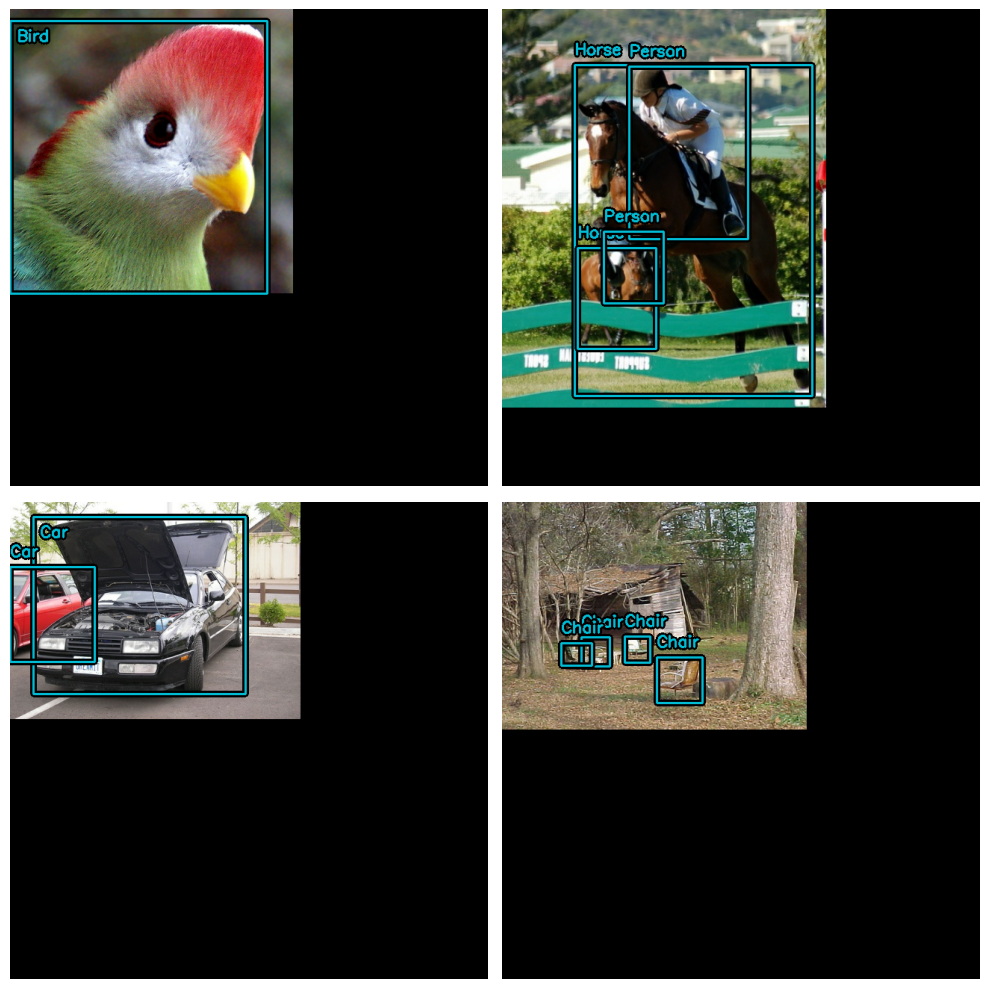

In [22]:
# список который будет содержать аугментированные изображения
# с помощью слоев кераса осуществляем предобработку изображений
augmenters = [
    # случайное горизонтальное отражение картинки по формату xywh
    keras_cv.layers.RandomFlip(mode="horizontal", bounding_box_format="xywh"),
    # изменение размера до заданного, причем случайно может быть увеличина или уменьшена
    keras_cv.layers.JitteredResize(target_size=(640, 640), scale_factor=(0.75, 1.3), bounding_box_format="xywh"),
]


def create_augmenter_fn(augmenters):
    def augmenter_fn(inputs):
        for augmenter in augmenters:
            inputs = augmenter(inputs)
        return inputs

    return augmenter_fn


# функция в виде переменной которой передан список
augmenter_fn = create_augmenter_fn(augmenters)

# обучающие данные подвергаем аугментации с помощью функции augmenter_fn, используя параллельные вычисления
train_ds = train_ds.map(augmenter_fn, num_parallel_calls=tf_data.AUTOTUNE)

# визуализация аугментированных данных
visualize_dataset(
    train_ds, # аугментированные обучающие данные
    bounding_box_format="xywh", # формат рамки
    value_range=(0, 255), # диапазон значений пикселей
    rows=2, # две строки картинок
    cols=2 # две колонки картинок
)

Великолепно! У нас сейчас есть дружелюбный к рамкам конвейер для аугментации данных.

Давайте зададим соответствующий формат для оценочных данных. Вместо использования метода `JitteredResize`, давайте используем более понятный для нашего слоя метод `keras_cv.layers.Resizing()`.

In [23]:
# функция в качестве переменной с помощью слоя керас изменяет размеры картинки до нужного и делает паддинг
inference_resizing = keras_cv.layers.Resizing(
    640, 640, bounding_box_format="xywh", pad_to_aspect_ratio=True
)

# тестовые данные аугментируются с помощью функции inference_resizing, используя параллельные вычисления
eval_ds = eval_ds.map(inference_resizing, num_parallel_calls=tf_data.AUTOTUNE)

Операция изменения размера тренировочных данных, использующая метод `JitteredResize()`, отличается от аналогичной операции над выходным набором данных, использующим метод `layers.Resizing(pad_to_aspect_ratio=True)`.

Хорошей практикой является визуализация и сравнение обоих датасетов:

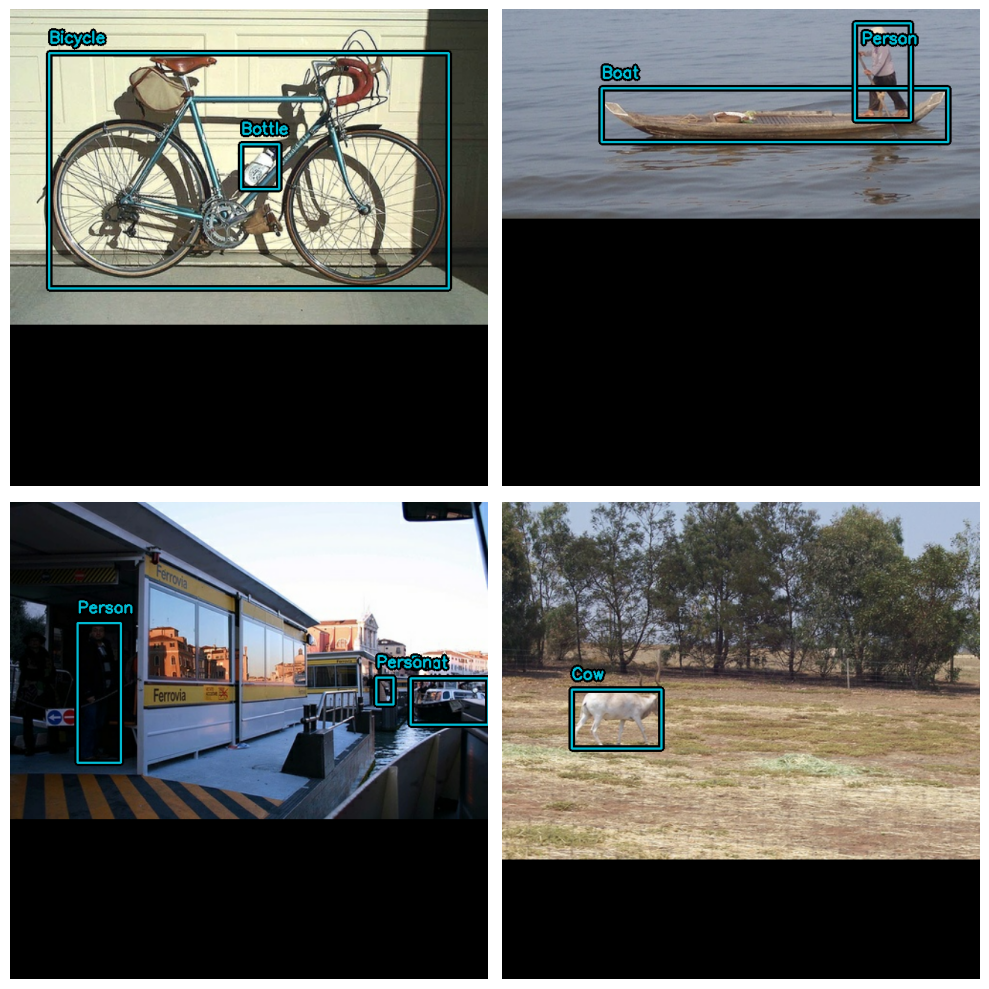

In [24]:
# визуализация тестового датасета
visualize_dataset(
    eval_ds, bounding_box_format="xywh", value_range=(0, 255), rows=2, cols=2
)

Наконец, давайте распакуем наш входной словарь, и подготовим его на ввод в нашу модель. В соответствии с аппаратной архитектурой типа TPU, тензоры должны быть плотными `Dense`, в противоположность неупорядоченным `Ragged`.

In [25]:
# функция перевода словаря в кортеж
def dict_to_tuple(inputs):
    return inputs["images"], bounding_box.to_dense(  # метод перевода объектных рамок в фиксированный тип данных
        inputs["bounding_boxes"], max_boxes=32
    )

# перевод обучающих и тестовых данных в кортеж фиксированной длинны где первый элемент картинка, воторой рамки
train_ds = train_ds.map(dict_to_tuple, num_parallel_calls=tf_data.AUTOTUNE)
eval_ds = eval_ds.map(dict_to_tuple, num_parallel_calls=tf_data.AUTOTUNE)

# предзагрузка данных, т.е. такой формат данных, который позволяет при обработке загружать следующую порцию данных для ускорения процесса обработки
train_ds = train_ds.prefetch(tf_data.AUTOTUNE)
eval_ds = eval_ds.prefetch(tf_data.AUTOTUNE)

### Оптимизатор

В этом руководстве, мы используем стандартный оптимизатор SGD (стохастический градиентный спуск) и обратные вызовы [`keras.callbacks.ReduceLROnPlateau`](https://keras.io/api/callbacks/reduce_lr_on_plateau/) для контроля скорости обучения.

Вы должны всегда включать параметр `global_clipnorm` когда обучаете модель по обнаружению объектов. Это исключит проблему "градиентного взрыва", которая не редка при обучении моделей по обнаружению объектов.

In [26]:
# переменная скорости обучения
base_lr = 0.005

# функция оптимизации
optimizer = keras.optimizers.SGD(
    learning_rate=base_lr,  # скорость обучения
    momentum=0.9,  # параметр учитывающий в моменте процесс обучения, помогает ускориь процесс обучения
    # Всегда задавайте переменную global_clipnorm
    # это глобальная норма градиентов, т.е. все градиенты будут ограничены нормой равной 10
    global_clipnorm=10.0
)

Чтобы достичь наилучшего результата с вашим набором данных, вы должны вручную задать расписание скорости обучения `PiecewiseConstantDecay`. Расписания `PiecewiseConstantDecay` призваны улучшать производительность, но их нельзя использовать в других задачах.

### Функции потерь

Возможно, вы не знакомы с потерями типа `"ciou"`. Они совсем не часто используются в других моделях, но в задачах по обнаружению объектов их иногда применяют.

Вкратце, ["Complete IoU"](https://arxiv.org/abs/1911.08287) функция потерь, использует метод "пересечения над объединением" и часто выбирается из-за своих свойств сходимости.

В KerasCV, вы можете использовать эту функцию потерь просто задав строковое значение `"ciou"` в методе `compile()`.

Мы также применяем и стандартные бинарные кросс-энтропийные функции при потерях в классификациях.

In [27]:
# сборка предобученной модели сети
pretrained_model.compile(
    classification_loss="binary_crossentropy",  # функция потерь для классификации
    box_loss="ciou",  # функция потерь для предсказаний
)

### Расчет метрик

Популярнейшая метрика по обнаружению объектов это COCO, которая была опубликована вместе с набором данных MSCOCO. KerasCV предоставляет легкий в использовании набор метрик СОСО внутри метода `keras_cv.callbacks.PyCOCOCallback`.

Примечательно, что мы используем обратные вызовы Keras вместо его метрик, для расчета метрик COCO. Это все потому, что для расчета метрик COCO требуется сохранять в памяти все предсказания модели, для всех вычислений, по конкретному набору данных, что совсем не практично во время обучения.

In [39]:
!pip install pycocotools

In [42]:
!pip install git+https://github.com/philferriere/cocoapi.git #egg=pycocotools^&subdirectory=PythonAPI

  Cloning https://github.com/philferriere/cocoapi.git to c:\users\shive\appdata\local\temp\pip-req-build-_acf5lk5
  Resolved https://github.com/philferriere/cocoapi.git to commit 2929bd2ef6b451054755dfd7ceb09278f935f7ad


  Running command git clone --filter=blob:none --quiet https://github.com/philferriere/cocoapi.git 'C:\Users\shive\AppData\Local\Temp\pip-req-build-_acf5lk5'
ERROR: git+https://github.com/philferriere/cocoapi.git does not appear to be a Python project: neither 'setup.py' nor 'pyproject.toml' found.


In [28]:
# обратный вызов для оценки модели
coco_metrics_callback = keras_cv.callbacks.PyCOCOCallback(
    eval_ds.take(20),  # количество записей из датасета, после которого происходит оценка
    bounding_box_format="xywh"  # формат объектных рамок
)

Наш конвейер данных подготовлен! Мы можем приступить к созданию модели и к ее обучению.

## Создание модели

Далее, используем KerasCV API для создания предобученной модели YOLOV8Detector. В этом учебном материале мы применяем предобученную модель, использующей сеть ResNet50 на наборе данных imagenet.

KerasCV делает более легким процесс создания модели `YOLOV8Detector` с любыми каркасоми на основе KerasCV.  
Просто используйте одну из готовых архитектур какую захотите!

Например:

In [29]:
# загрузка предобученной модели, которая будет основой другой модели YOLO
model = keras_cv.models.YOLOV8Detector.from_preset(
    "resnet50_imagenet",  # модель ResNet50, обученная на датасете ImageNet
    bounding_box_format="xywh",  # формат объектных рамок
    num_classes=20,  # количество моделей в классе
)

Это все что нужно для построения модели YOLOv8 в KerasCV. YOLOv8 принимает кортежи цельных изображений тензора и словари объектных рамок для методов `fit()` и `train_on_batch()`.

Это соответствует тому, что мы сконструировали для подачи на конвейер данных выше.

## Обучение нашей модели

Все что осталось сделать это обучить нашу модель. Модели обнаружения объектов KerasCV следуют стандарту потока Keras, применяя методы `compile()` и `fit()`.

Давайте соберем нашу модель:

In [31]:
# сборка необученной модели
model.compile(
    classification_loss="binary_crossentropy",  # функция потерь для классификации
    box_loss="ciou",  # функция потерь для предсказаний
    optimizer=optimizer,  # SGD
)

Если хотите полностью обучить модель, удалить `.take(20)` из всех ссылок на набор данных (ниже и в инициализирующих метриках обратного вызова).

In [32]:
%%time
model.fit(
    train_ds.take(20),
    # Запуск 10-35~ эпох для достижения хороших показателей
    epochs=10,
    callbacks=[coco_metrics_callback],
)

Epoch 1/10
20/20 ━━━━━━━━━━━━━━━━━━━━ 67s 3s/step
creating index...
index created!
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.18s).
Accumulating evaluation results...
DONE (t=0.09s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.002
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.001
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.007
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.010
 Average Recall     (AR) @[ IoU=0

## Заключительное отображение результатов

KerasCV позволяет легко вывести результат обнаружения объектов. `model.predict(images)`, содержащий тензор объектных рамок. По умолчанию, метод `YOLOV8Detector.predict()` произведет операцию подавление немаксимумов для вас.

В секции `keras_cv`, мы будем использовать полученную ранее, предобученную модель:

In [33]:
# модель на основе предустановленной модели yolo_v8_m_pascalvoc"
model = keras_cv.models.YOLOV8Detector.from_preset(
    "yolo_v8_m_pascalvoc",  # указание на модель
    bounding_box_format="xywh"  # формат объектных рамок
)

Далее, для удобства мы соорудим набор с большими пакетами:

In [34]:
# визуализация непакетированных данных
visualization_ds = eval_ds.unbatch()

# визуализация пакетированных данных нефиксированной длины
visualization_ds = visualization_ds.ragged_batch(16)

# визуализация перемешанных данных
visualization_ds = visualization_ds.shuffle(8)

Сделаем простую функцию для отображения нашего вывода:

In [35]:
# функция визуализации результатов
def visualize_detections(model, dataset, bounding_box_format):
    images, y_true = next(iter(dataset.take(1)))  # первый итерируемый кортеж из датасета
    y_pred = model.predict(images)  # предсказание для картинки
    visualization.plot_bounding_box_gallery(
        images,  # картинка
        value_range=(0, 255), # значения пекселей
        bounding_box_format=bounding_box_format, # формат
        y_true=y_true, # истинные рамки
        y_pred=y_pred, # предсказанные рамки
        scale=4, # масштаб
        rows=2, # количество строк
        cols=2, # количество колонок
        show=True, # показывать рамки
        font_scale=0.7, # размер шрифта
        class_mapping=class_mapping, # метод классификации
    )

Вам нужно понастраивать параметры метода NonMaxSuppression до визуально привлекательного результата.

1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step


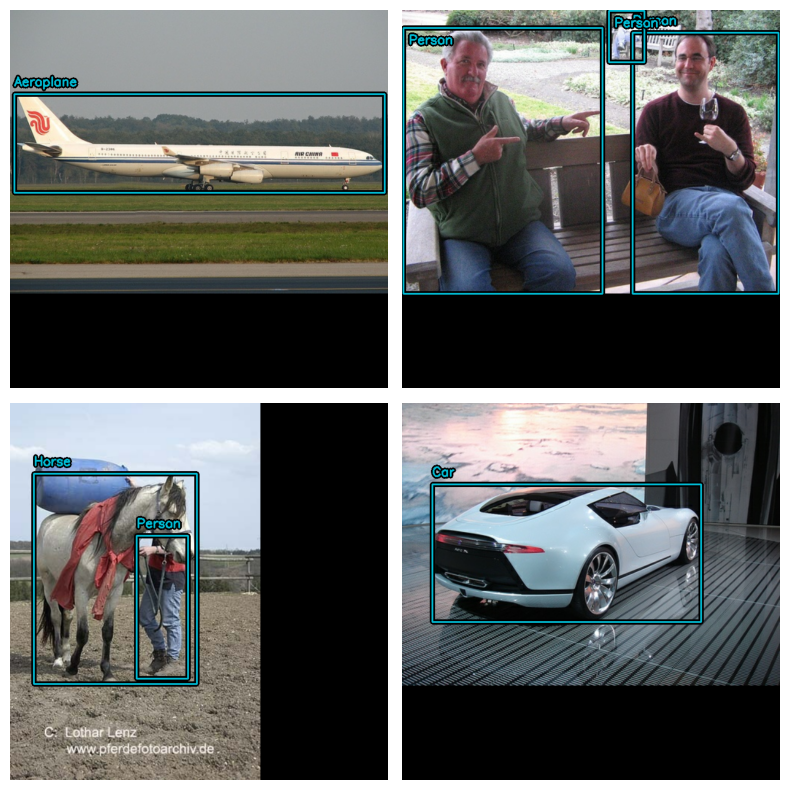

In [36]:
model.prediction_decoder = keras_cv.layers.NonMaxSuppression(
    bounding_box_format="xywh",  # формат объектных рамок
    from_logits=True,  # предсказания в виде логитов
    iou_threshold=0.5,  # порог перекрытия
    confidence_threshold=0.75,  # порог уверенности
)

visualize_detections(model, dataset=visualization_ds, bounding_box_format="xywh")

Превосходно!
Наконец, еще один полезный шаблон кода, на заметку, визуализация обнаружений `keras.callbacks.Callback` для мониторинга процесса обучения:

In [37]:
# класс обратного вызова для оценки процесса обучения
class VisualizeDetections(keras.callbacks.Callback):
    def on_epoch_end(self, epoch, logs):
        visualize_detections(
            self.model, bounding_box_format="xywh", dataset=visualization_ds
        )

## Заключения и следующие шаги

KerasCV позволяет легко создать конвейеры по обнаружению объектов. В данном руководстве, мы начинали с написания загрузчика данных, используя описание характеристик объектных рамок в KerasCV Далее, мы собрали конвейер данных производственного уровня для аугментации, используя предпроцессные уровни KerasCV с кодом $<50$ строк.

Компоненты KerasCV по обнаружению объектов могут быть использованы независимо друг от друга, но в тоже время, имеют тесную интеграцию между собой.

KerasCV позволяет на профессиональном уровне производить аугментацию объектных рамок, обучение модели, визуализацию и подсчет метрик.

Немного заданий для читателя:
* добавьте дополнительную технику аугментации для улучшения производительности модели
- настройте гиперпараметры и аугментацию данных для получения результатов высокого качества
* обучите модель по обнаружению объектов на личном наборе данных

И в заключении небольшой забавный код, для демонстрации мощи API KerasCV!

In [38]:
# демонстрирует использование предобученной модели для обнаружения объектов на изображениях, которые были
# сгенерированы с использованием модели генерации изображений Stable Diffusion V2.
stable_diffusion = keras_cv.models.StableDiffusionV2(512, 512)

# Генерируются изображения с использованием модели
images = stable_diffusion.text_to_image(
    prompt="A zoomed out photograph of a cool looking cat. The cat stands in a beautiful forest",
    negative_prompt="unrealistic, bad looking, malformed",
    batch_size=4,  # 4 картинки
    seed=1231,
)

By using this model checkpoint, you acknowledge that its usage is subject to the terms of the CreativeML Open RAIL++-M license at https://github.com/Stability-AI/stablediffusion/blob/main/LICENSE-MODEL
1356917/1356917 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
1361968152/1361968152 ━━━━━━━━━━━━━━━━━━━━ 178s 0us/step
3464605600/3464605600 ━━━━━━━━━━━━━━━━━━━━ 449s 0us/step
50/50 ━━━━━━━━━━━━━━━━━━━━ 1395s 18s/step
198180272/198180272 ━━━━━━━━━━━━━━━━━━━━ 24s 0us/step


In [39]:
# слой NonMaxSuppression, позволяет контролировать подавление немаксимумов
prediction_decoder = keras_cv.layers.NonMaxSuppression(
    bounding_box_format="xywh",  # формат объектных рамок
    from_logits=True,  # применение логитов (позволяет обойтись без функции активации в данном слое)
    iou_threshold=0.4,  # порог IOU
    confidence_threshold=0.7,  # настройка порога уверенности (позволяет контролировать подавление немаксимумов)
)

# получаем настройки предобученной модели YOLO
model = keras_cv.models.YOLOV8Detector.from_preset(
    "yolo_v8_m_pascalvoc",  # модель YOLO, предобученная на картинках из набора Pascal VOC
    bounding_box_format="xywh",  # формат объектных рамок
    prediction_decoder=prediction_decoder,  # тип декодера (подавление немаксимумов)
)

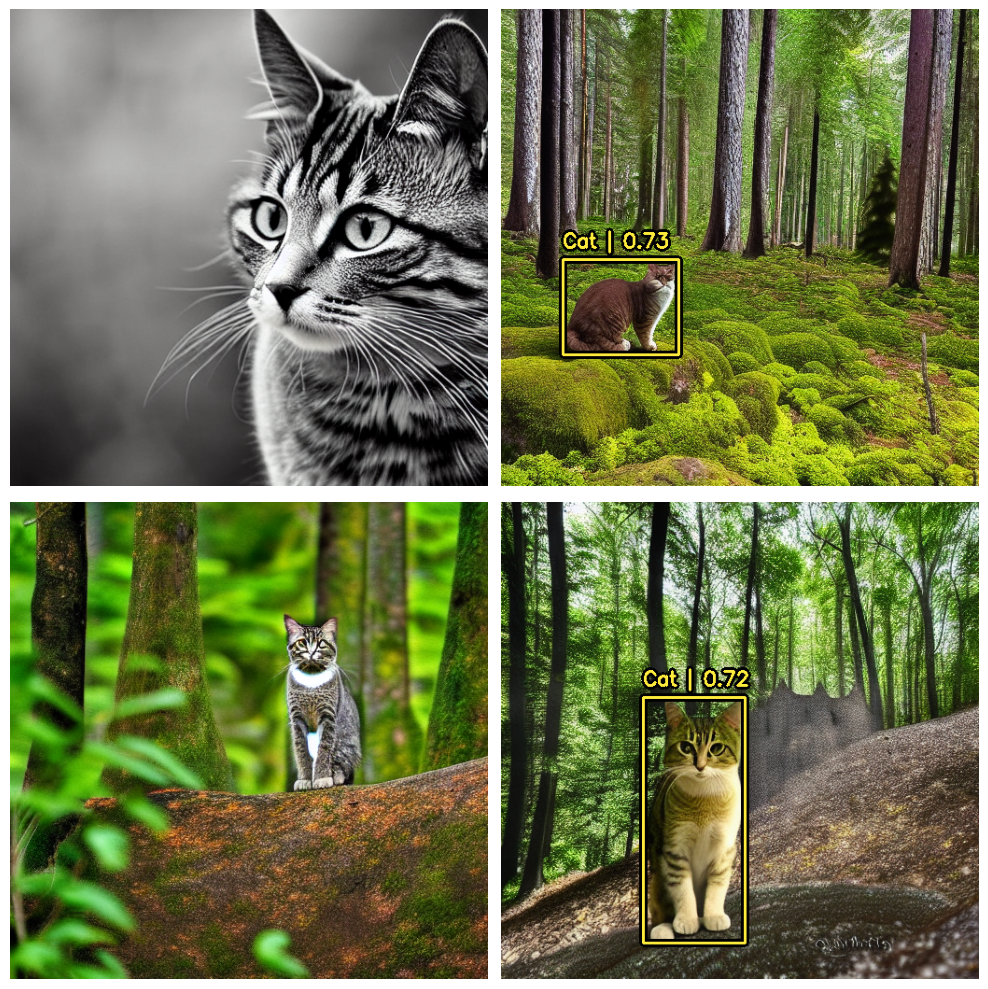

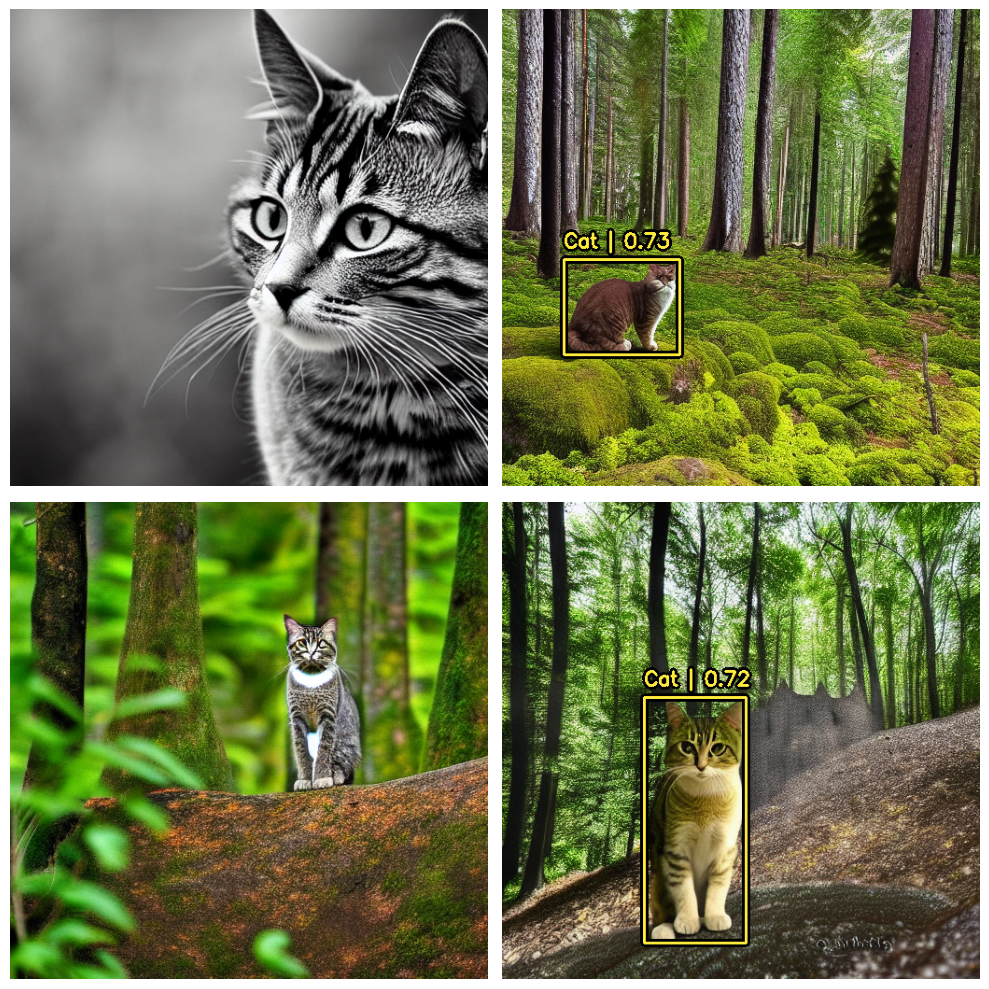

In [40]:
# получение закодированных предсказаний от модели
encoded_predictions = model(images)

# декодироване предсказаний
y_pred = model.decode_predictions(encoded_predictions, images)

# визуализация в виде галереи
visualization.plot_bounding_box_gallery(
    images,
    value_range=(0, 255),
    y_pred=y_pred,
    rows=2,
    cols=2,
    scale=5,
    font_scale=0.7,
    bounding_box_format="xywh",
    class_mapping=class_mapping,
)

### Выводы

Не удалось загрузить картинку с собакой и цветками (HTTP Error 429). Пришлось заменить ссылку на другой источник с такой же картинкой.

При загрузке датасета оказалось, что в тренировочной выборке 2500 картинок, а в тестовой 4500. Т.к. в машинном обучении рекомендуется для тестовых денных использовать 10-20% от объема тренировочных данных. Тестовая выборка была сокращена в 10 раз с целью экономии ресурсов.

Авторами статьи рекомендовано использовать от 10 до 35 и более эпох обучения. Что достаточно требовательно к ресурсам, обучение длилось 74 минуты

В последнем блоке статьи авторами не реализовано распознавание кошек на сгенерированных картинках (видимо из-за высокого порога уверенности). Был добавлен блок с настройками `prediction_decoder` и использована предобученная модель YOLO.

Для обучения модели детектирования объектов мможно загрузиь преварительно обученные модели, для более быстрого обучения и использования.